### **Final Project: Denoising Images**
Name: Tacsay, Marie Emmanuelle
<br> Section: CPE32S8

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import os
import cv2

from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dropout, BatchNormalization, Input
from tensorflow.keras.callbacks import EarlyStopping

%matplotlib inline

In [3]:
import os
import cv2
import numpy as np

# Define the path to the dataset directory
dataset_path = "/content/drive/MyDrive/DATASET_FINALPROJ/Initial_Data"

# store image names in list for later use
train_img = sorted(os.listdir(dataset_path + '/train'))
train_cleaned_img = sorted(os.listdir(dataset_path + '/train_cleaned'))
test_img = sorted(os.listdir(dataset_path + '/test'))

# prepare function
def process_image(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale
    img = cv2.resize(img, (612, 360))
    img = np.reshape(img, (360, 612, 1))  # Reshape to add channel dimension
    img = img / 255.0  # Normalize
    return img

# preprocess images
train = []
train_cleaned = []
test = []

for f in train_img:
    train.append(process_image(os.path.join(dataset_path, 'train', f)))

for f in train_cleaned_img:
    train_cleaned.append(process_image(os.path.join(dataset_path, 'train_cleaned', f)))

for f in test_img:
    test.append(process_image(os.path.join(dataset_path, 'test', f)))

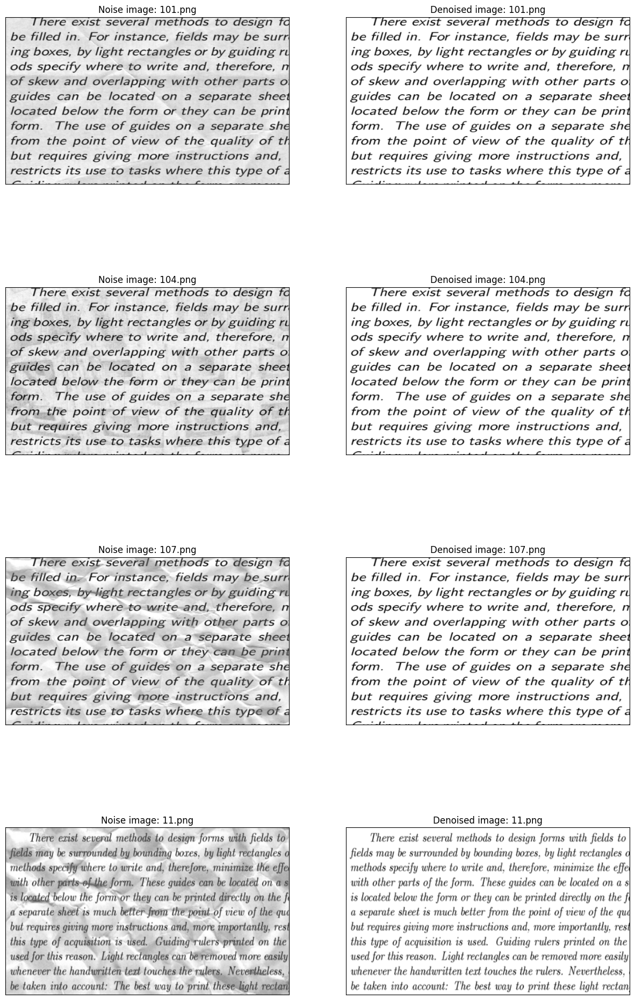

In [4]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train[i][:,:,0], cmap='gray')
    plt.title('Noise image: {}'.format(train_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_cleaned[i][:,:,0], cmap='gray')
    plt.title('Denoised image: {}'.format(train_img[i]))

plt.show()

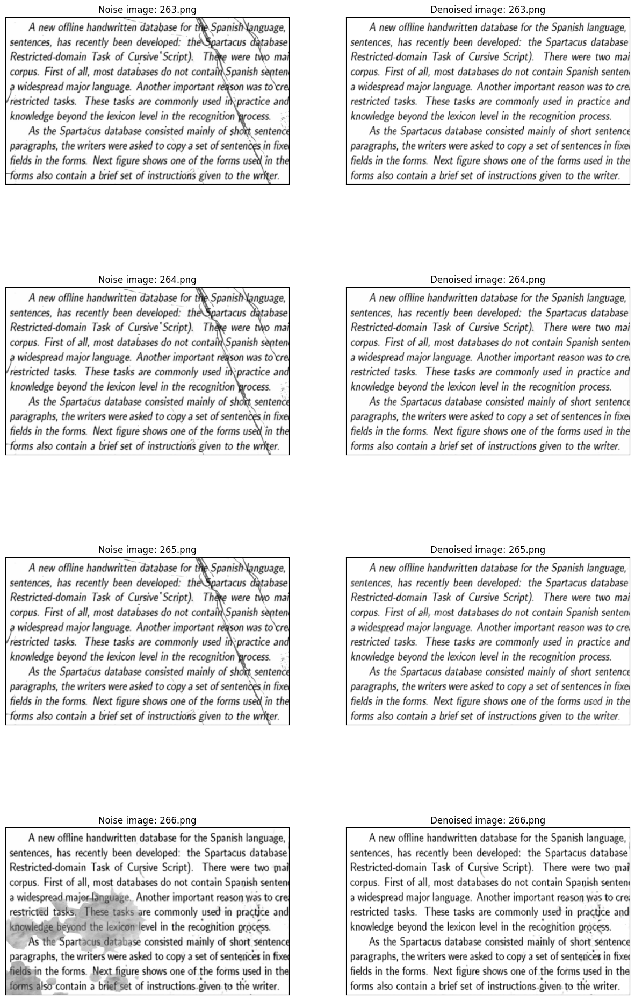

In [5]:
import matplotlib.pyplot as plt

# Assuming train and train_cleaned are your lists and train_img contains the titles
num_images = len(train)

plt.figure(figsize=(15, 25))
for i in range(0, 8, 2):
    idx = num_images - 80 + i//2  # Indexing to get the last 4 images

    plt.subplot(4, 2, i + 1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train[idx][:, :, 0], cmap='gray')
    plt.title('Noise image: {}'.format(train_img[idx]))

    plt.subplot(4, 2, i + 2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_cleaned[idx][:, :, 0], cmap='gray')
    plt.title('Denoised image: {}'.format(train_img[idx]))

plt.show()

In [6]:
# convert list to numpy array
X_train = np.asarray(train)
Y_train = np.asarray(train_cleaned)
X_test = np.asarray(test)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.20)

##Autoencoder

In [37]:
def build_autoenocder():
    input_img = Input(shape=(360,612,1), name='image_input')

    #enoder
    x = Conv2D(32, (3,3), activation='relu', padding='same',
               name='Conv1')(input_img)
    x = MaxPooling2D((2,2), padding='same', name='pool1')(x)
    x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv2')(x)
    x = MaxPooling2D((2,2), padding='same', name='pool2')(x)

    #decoder
    x = Conv2D(64, (3,3), activation='relu', padding='same', name='Conv3')(x)
    x = UpSampling2D((2,2), name='upsample1')(x)
    x = Conv2D(32, (3,3), activation='relu', padding='same', name='Conv4')(x)
    x = UpSampling2D((2,2), name='upsample2')(x)
    x = Conv2D(1, (3,3), activation='sigmoid', padding='same', name='Conv5')(x)

    #model
    autoencoder = Model(inputs=input_img, outputs=x)
    autoencoder.compile(optimizer='adam', loss='mean_squared_error',
                        metrics = ['mae'])
    return autoencoder

In [38]:
autoencoder = build_autoenocder()
autoencoder.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image_input (InputLayer)    [(None, 360, 612, 1)]     0         
                                                                 
 Conv1 (Conv2D)              (None, 360, 612, 32)      320       
                                                                 
 pool1 (MaxPooling2D)        (None, 180, 306, 32)      0         
                                                                 
 Conv2 (Conv2D)              (None, 180, 306, 64)      18496     
                                                                 
 pool2 (MaxPooling2D)        (None, 90, 153, 64)       0         
                                                                 
 Conv3 (Conv2D)              (None, 90, 153, 64)       36928     
                                                                 
 upsample1 (UpSampling2D)    (None, 180, 306, 64)      0   

In [39]:
callback = EarlyStopping(monitor='loss', patience=30)
history = autoencoder.fit(X_train, Y_train, validation_data = (X_val, Y_val), epochs=400, batch_size=8)

Epoch 1/400
22/22 [==============================] - 5s 124ms/step - loss: 0.0815 - mae: 0.1708 - val_loss: 0.0670 - val_mae: 0.1100
Epoch 2/400
22/22 [==============================] - 2s 93ms/step - loss: 0.0675 - mae: 0.1107 - val_loss: 0.0670 - val_mae: 0.1099
Epoch 3/400
22/22 [==============================] - 2s 101ms/step - loss: 0.0675 - mae: 0.1107 - val_loss: 0.0669 - val_mae: 0.1102
Epoch 4/400
22/22 [==============================] - 2s 94ms/step - loss: 0.0580 - mae: 0.1434 - val_loss: 0.0439 - val_mae: 0.1383
Epoch 5/400
22/22 [==============================] - 2s 95ms/step - loss: 0.0399 - mae: 0.1267 - val_loss: 0.0344 - val_mae: 0.1212
Epoch 6/400
22/22 [==============================] - 3s 115ms/step - loss: 0.0299 - mae: 0.1024 - val_loss: 0.0247 - val_mae: 0.0793
Epoch 7/400
22/22 [==============================] - 3s 122ms/step - loss: 0.0215 - mae: 0.0761 - val_loss: 0.0184 - val_mae: 0.0659
Epoch 8/400
22/22 [==============================] - 3s 113ms/step - los

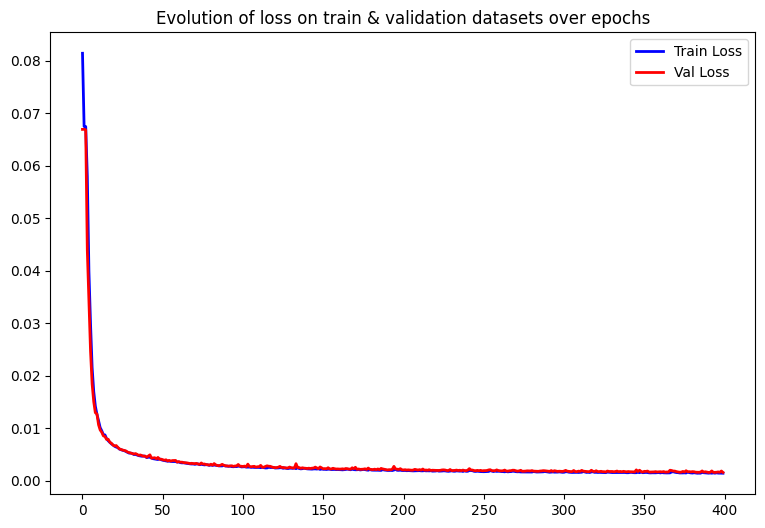

In [40]:
# Check how loss & mae went down
epoch_loss = history.history['loss']
epoch_val_loss = history.history['val_loss']
epoch_mae = history.history['mae']
epoch_val_mae = history.history['val_mae']

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

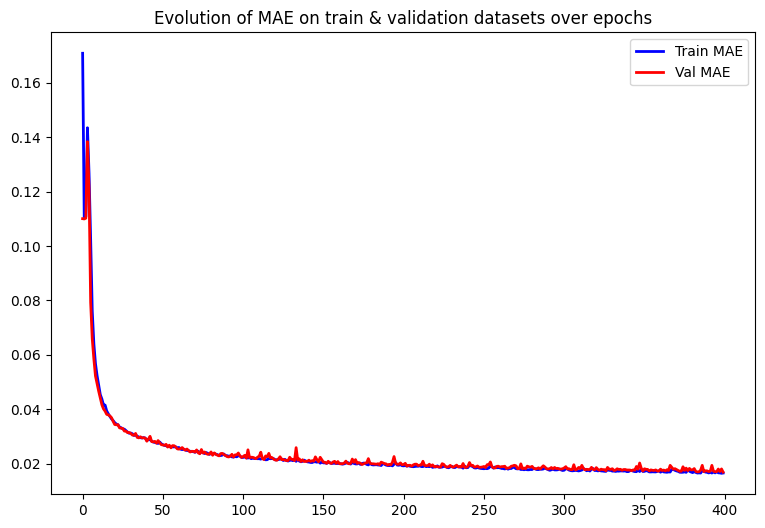

In [41]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,2)
plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

In [42]:
# predict/clean test images
Y_test = autoencoder.predict(X_test, batch_size= 8)

11/11 [==============================] - 0s 30ms/step


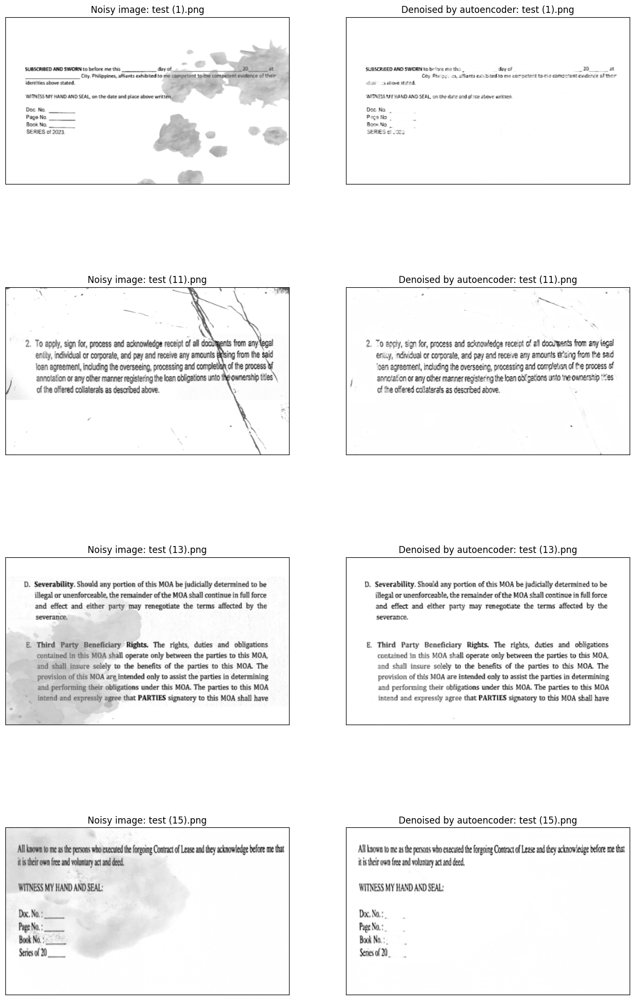

In [43]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[i][:,:,0], cmap='gray')
    plt.title('Noisy image: {}'.format(test_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Y_test[i][:,:,0], cmap='gray')
    plt.title('Denoised by autoencoder: {}'.format(test_img[i]))

plt.show()

## UNET

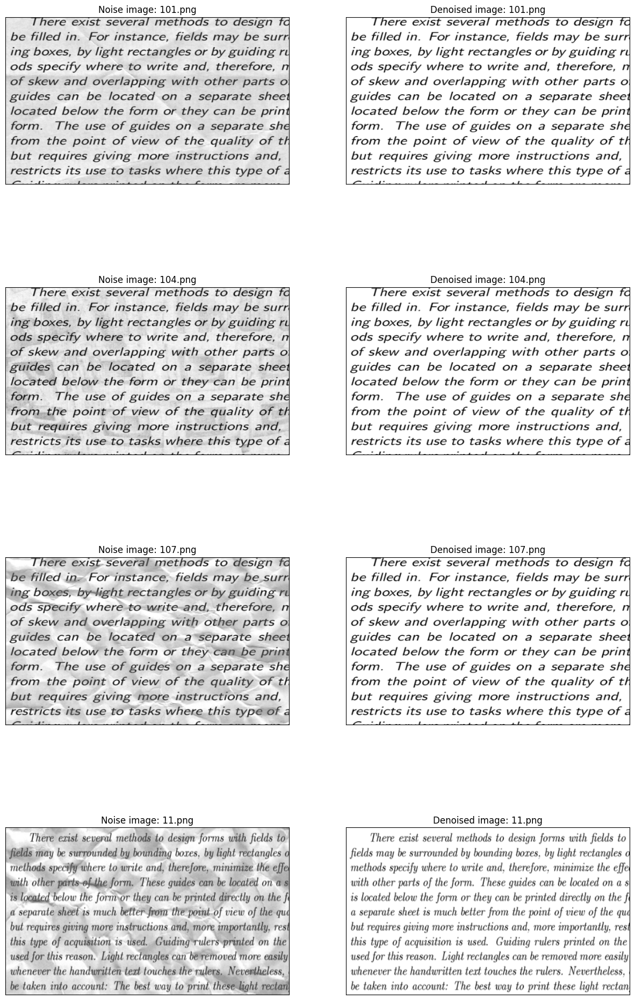

In [13]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train[i][:,:,0], cmap='gray')
    plt.title('Noise image: {}'.format(train_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_cleaned[i][:,:,0], cmap='gray')
    plt.title('Denoised image: {}'.format(train_img[i]))

plt.show()

In [14]:
# convert list to numpy array
X_train = np.asarray(train)
Y_train = np.asarray(train_cleaned)
X_test = np.asarray(test)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.20)

In [15]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model

def build_unet(input_size=(360, 612, 1)):
    input_img = Input(shape=input_size, name='image_input')

    # Encoder
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    pool1 = MaxPooling2D((2, 2), padding='same')(conv1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D((2, 2), padding='same')(conv2)

    # Decoder
    up1 = UpSampling2D((2, 2))(pool2)
    merge1 = concatenate([conv2, up1], axis=3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(merge1)
    up2 = UpSampling2D((2, 2))(conv3)
    merge2 = concatenate([conv1, up2], axis=3)
    conv4 = Conv2D(32, (3, 3), activation='relu', padding='same')(merge2)
    conv5 = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(conv4)

    # Model
    unet_model = Model(inputs=input_img, outputs=conv5)
    unet_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['mae'])

    return unet_model

# Build the U-Net model
unet_model = build_unet(input_size=(360, 612, 1))
unet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 image_input (InputLayer)    [(None, 360, 612, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 360, 612, 32)         320       ['image_input[0][0]']         
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 180, 306, 32)         0         ['conv2d[0][0]']              
 D)                                                                                               
                                                                                                  
 conv2d_1 (Conv2D)           (None, 180, 306, 64)         18496     ['max_pooling2d[0][0]'] 

In [16]:
# Assuming you have training data in 'X_train' (noisy images) and 'Y_train' (clean images)

history = unet_model.fit(X_train, Y_train, epochs=150, batch_size=8, validation_data = (X_val, Y_val))

Epoch 1/150
22/22 [==============================] - 19s 468ms/step - loss: 0.4166 - mae: 0.2165 - val_loss: 0.3220 - val_mae: 0.1578
Epoch 2/150
22/22 [==============================] - 6s 255ms/step - loss: 0.3014 - mae: 0.1396 - val_loss: 0.2664 - val_mae: 0.1226
Epoch 3/150
22/22 [==============================] - 6s 268ms/step - loss: 0.2172 - mae: 0.0888 - val_loss: 0.1828 - val_mae: 0.0595
Epoch 4/150
22/22 [==============================] - 6s 254ms/step - loss: 0.1705 - mae: 0.0474 - val_loss: 0.1653 - val_mae: 0.0392
Epoch 5/150
22/22 [==============================] - 6s 263ms/step - loss: 0.1589 - mae: 0.0351 - val_loss: 0.1593 - val_mae: 0.0317
Epoch 6/150
22/22 [==============================] - 5s 250ms/step - loss: 0.1548 - mae: 0.0303 - val_loss: 0.1570 - val_mae: 0.0292
Epoch 7/150
22/22 [==============================] - 6s 259ms/step - loss: 0.1527 - mae: 0.0276 - val_loss: 0.1550 - val_mae: 0.0264
Epoch 8/150
22/22 [==============================] - 6s 264ms/step -

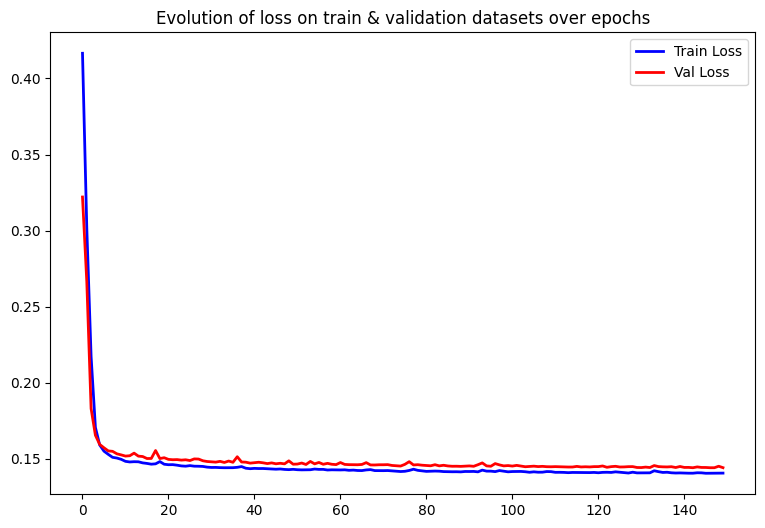

In [19]:
# Check how loss & mae went down
epoch_loss = history.history['loss']
epoch_val_loss = history.history['val_loss']
epoch_mae = history.history['mae']
epoch_val_mae = history.history['val_mae']

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

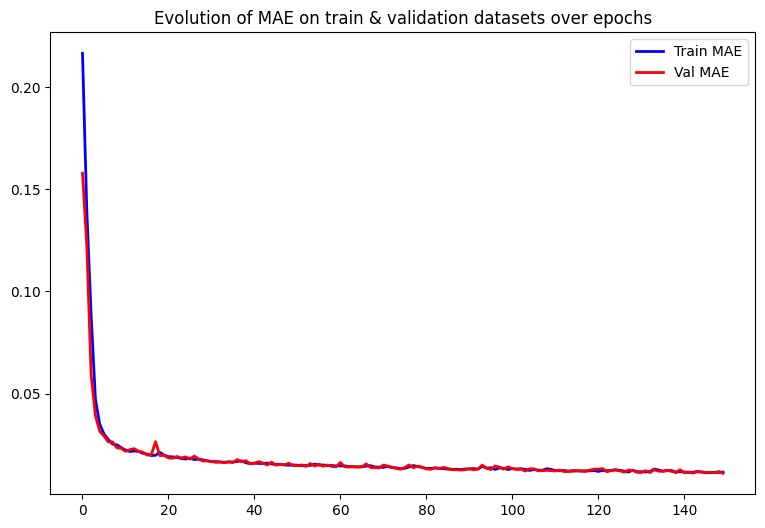

In [21]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,2)
plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

In [35]:
# predict/clean test images
Y_test = unet_model.predict(X_test, batch_size= 8)

11/11 [==============================] - 3s 311ms/step


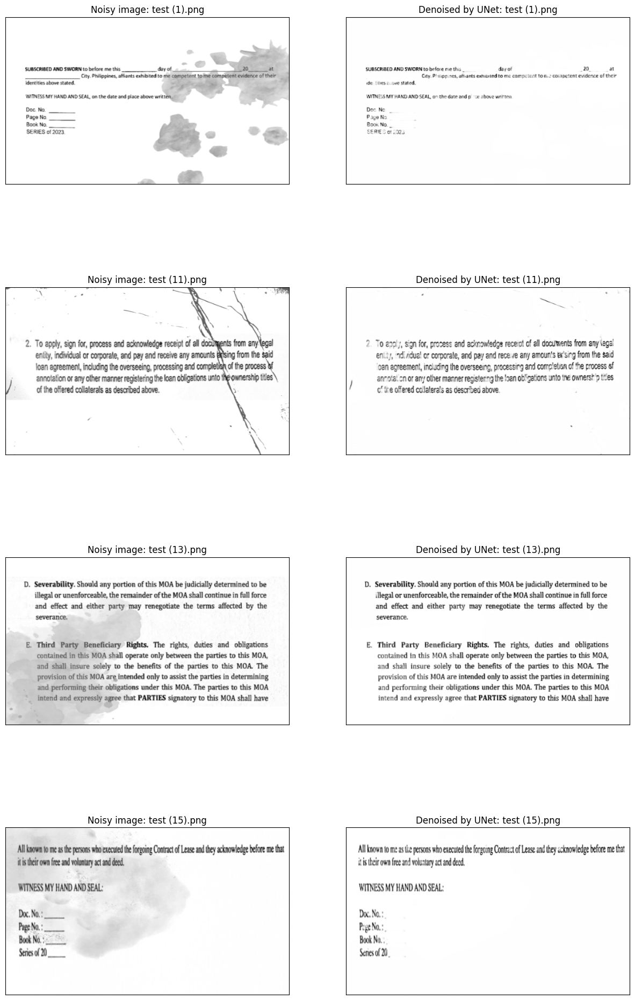

In [36]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[i][:,:,0], cmap='gray')
    plt.title('Noisy image: {}'.format(test_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(Y_test[i][:,:,0], cmap='gray')
    plt.title('Denoised by UNet: {}'.format(test_img[i]))

plt.show()

## Noise2Void

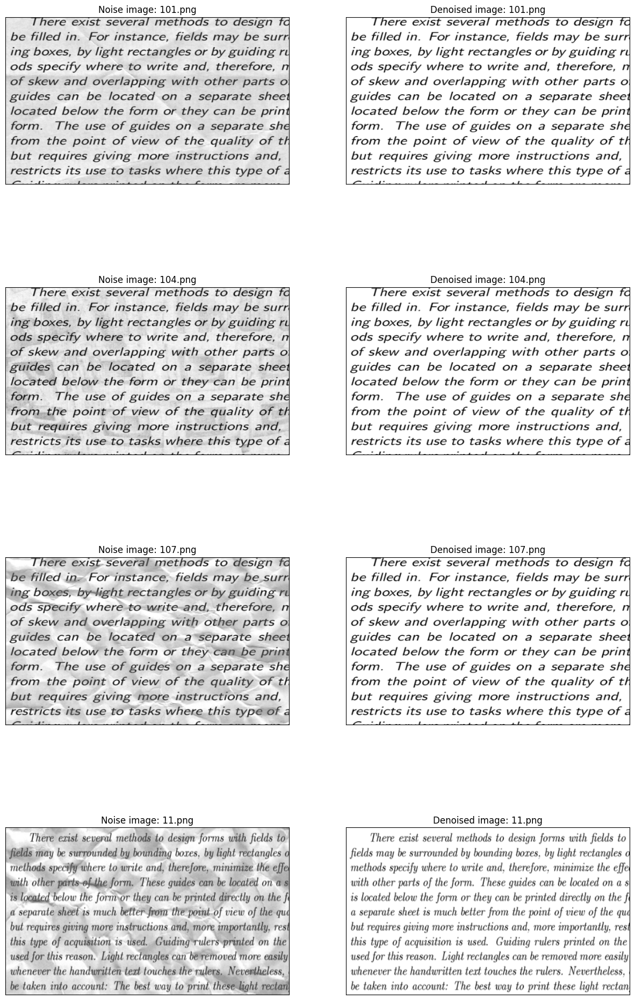

In [26]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train[i][:,:,0], cmap='gray')
    plt.title('Noise image: {}'.format(train_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_cleaned[i][:,:,0], cmap='gray')
    plt.title('Denoised image: {}'.format(train_img[i]))

plt.show()

In [27]:
# convert list to numpy array
X_train = np.asarray(train)
Y_train = np.asarray(train_cleaned)
X_test = np.asarray(test)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.20)

In [28]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 7.3 MB/s eta 0:00:00


In [29]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation
from tensorflow.keras.models import Model
from tensorflow_addons.layers import InstanceNormalization

def convolution_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    return x

def Noise2Void(input_size=(360, 612, 1), num_filters=64):
    inputs = Input(input_size)

    conv1 = convolution_block(inputs, num_filters)
    conv2 = convolution_block(conv1, num_filters)
    conv3 = convolution_block(conv2, num_filters)

    conv4 = Conv2D(input_size[-1], 1, padding='same')(conv3)

    model = Model(inputs=inputs, outputs=conv4)
    return model

# Create Noise2Void model
model = Noise2Void()
model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 360, 612, 1)]     0         
                                                                 
 conv2d_5 (Conv2D)           (None, 360, 612, 64)      640       
                                                                 
 batch_normalization (Batch  (None, 360, 612, 64)      256       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 360, 612, 64)      0         
                                                                 
 conv2d_6 (Conv2D)           (None, 360, 612, 64)      36928     
                                                                 
 batch_normalization_1 (Bat  (None, 360, 612, 64)      256       
 chNormalization)                                          

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [30]:
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the model
history = model.fit(X_train, Y_train, epochs=150, batch_size=8, validation_data=(X_val, Y_val))

Epoch 1/150
22/22 [==============================] - 21s 538ms/step - loss: 0.7419 - mae: 0.7093 - val_loss: 0.5502 - val_mae: 0.7097
Epoch 2/150
22/22 [==============================] - 8s 350ms/step - loss: 0.0412 - mae: 0.1360 - val_loss: 0.2613 - val_mae: 0.4900
Epoch 3/150
22/22 [==============================] - 7s 332ms/step - loss: 0.0200 - mae: 0.0931 - val_loss: 0.1504 - val_mae: 0.3742
Epoch 4/150
22/22 [==============================] - 7s 336ms/step - loss: 0.0145 - mae: 0.0789 - val_loss: 0.1154 - val_mae: 0.3260
Epoch 5/150
22/22 [==============================] - 7s 317ms/step - loss: 0.0127 - mae: 0.0746 - val_loss: 0.0790 - val_mae: 0.2605
Epoch 6/150
22/22 [==============================] - 7s 317ms/step - loss: 0.0117 - mae: 0.0709 - val_loss: 0.0735 - val_mae: 0.2440
Epoch 7/150
22/22 [==============================] - 7s 321ms/step - loss: 0.0089 - mae: 0.0618 - val_loss: 0.0639 - val_mae: 0.2149
Epoch 8/150
22/22 [==============================] - 7s 325ms/step -

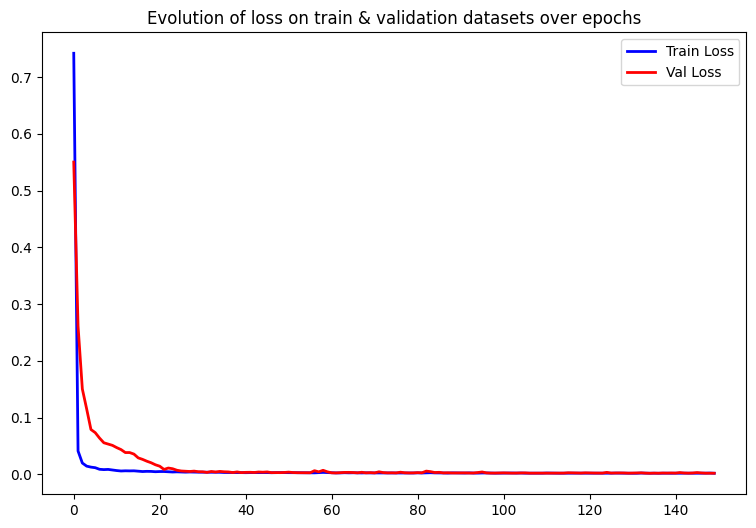

In [31]:
# Check how loss & mae went down
epoch_loss = history.history['loss']
epoch_val_loss = history.history['val_loss']
epoch_mae = history.history['mae']
epoch_val_mae = history.history['val_mae']

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.plot(range(0,len(epoch_loss)), epoch_loss, 'b-', linewidth=2, label='Train Loss')
plt.plot(range(0,len(epoch_val_loss)), epoch_val_loss, 'r-', linewidth=2, label='Val Loss')
plt.title('Evolution of loss on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

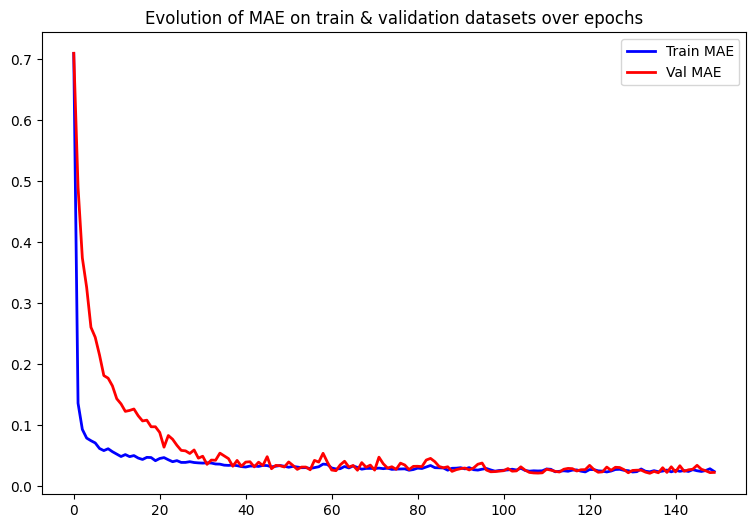

In [32]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,2)
plt.plot(range(0,len(epoch_mae)), epoch_mae, 'b-', linewidth=2, label='Train MAE')
plt.plot(range(0,len(epoch_val_mae)), epoch_val_mae, 'r-', linewidth=2,label='Val MAE')
plt.title('Evolution of MAE on train & validation datasets over epochs')
plt.legend(loc='best')

plt.show()

In [33]:
def denoise_images(model, X_test):
    denoised_images = model.predict(X_test)
    return denoised_images

denoised_images = denoise_images(model, X_test)

3/3 [==============================] - 13s 3s/step


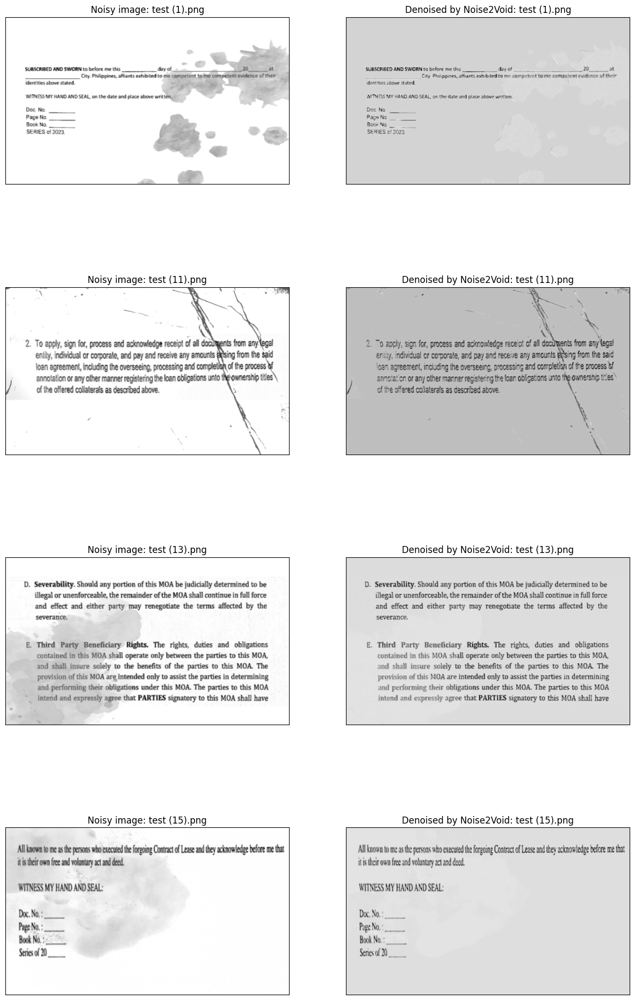

In [34]:
# Plot the results
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[i][:,:,0], cmap='gray')
    plt.title('Noisy image: {}'.format(test_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(denoised_images[i][:,:,0], cmap='gray')
    plt.title('Denoised by Noise2Void: {}'.format(test_img[i]))

plt.show()